In [2]:
## Downloading the dataset for Indian number plates

In [3]:
# Install Roboflow and download YOLOv5-compatible dataset
!pip install -q roboflow
from roboflow import Roboflow



# Download dataset from public link
!curl -L "https://public.roboflow.com/ds/K9IjAYLk5y?key=9th6uXdcDR" > roboflow.zip
!unzip -q roboflow.zip
!rm roboflow.zip


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.3/85.3 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 36.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 103.8 MB/s eta 0:00:0000:0100:01
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
sigstore 3.6.1 requires rich~=13.0, but you have rich 14.0.0 which is incompatible.
datasets 3.5.0 requires fsspec[http]<=2024.12.0,>=2023.1.0, but you have fsspec 2025.3.2 which is incompatible.
nilearn 0.11.1 requires scikit-learn>=1.4.0, but you have scikit-learn 1.2.2 which is incompatible.
google-colab 1.0.0 requires notebook==6.5.5, but you have notebook 6.5.4 which is incompatible.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 2.2.3 which is incompatible.
google-

In [4]:
## Dataset Inspection

In [5]:
! pwd

/kaggle/working


In [6]:
import os

# List all top-level folders and files to locate the dataset
for item in os.listdir("/kaggle/working"):
    print( item)

train
README.roboflow.txt
test
data.yaml
valid
.virtual_documents


In [7]:
## Inspecting the directory structure

### we check how the dataset directory looks like in tree-like structure to understand the different directories and sub-directories. The function "tree" helps us to do this.

In [8]:

from pathlib import Path

def tree(dir_path: Path, prefix: str=''):
    contents = list(dir_path.iterdir())
    pointers = ['├── '] * (len(contents) - 1) + ['└── ']
    for pointer, path in zip(pointers, contents):
        yield prefix + pointer + path.name
        if path.is_dir():
            extension = '│   ' if pointer == '├── ' else '    '
            yield from tree(path, prefix + extension)

dataset_root = Path("/kaggle/working")  # We'll refine this after seeing the top-level name
for line in tree(dataset_root):
    print(line)


├── train
│   ├── images
│   │   ├── 620bd952592bc0e9_jpg.rf.38c15cb6b6cdfd2810cc6221e45f04ee.jpg
│   │   ├── 5fb888d79b551331_jpg.rf.b5fee649bb7814d73d90fdd22ce129bc.jpg
│   │   ├── 80d21c58a71a0751_jpg.rf.a790b0cb81061f58c17bd18f225c96fd.jpg
│   │   ├── 28e26a4eb646c67a_jpg.rf.ebc297ef09ec5a7f8dcb0d0989d793ad.jpg
│   │   ├── 26183d88c4f8012f_jpg.rf.b9d1ec7045a2a9131859b0b18c8d203e.jpg
│   │   ├── a9b2a2018f845393_jpg.rf.f11e98cbbbe047ad1edf2370a696c3e7.jpg
│   │   ├── a929dc75c20da7d8_jpg.rf.9300a2de5d27c683842fcd23736a5d88.jpg
│   │   ├── 88fc866f92860d70_jpg.rf.15f733df4a6ad896778e8f8a196acfc1.jpg
│   │   ├── 2d40d6e377c82ec9_jpg.rf.28e8161f6c504b302c1a50f27dd59e45.jpg
│   │   ├── 18098dc9ee6aad80_jpg.rf.78b900dcb3a8fdc95c0566f08f8657ac.jpg
│   │   ├── a6e3b0b73220cd32_jpg.rf.b36ceec258cb3cae076a055265e16c9f.jpg
│   │   ├── 5290f4027491d09b_jpg.rf.3f3b30829f571d5321712f126e797f07.jpg
│   │   ├── a67bc3f5f8650c73_jpg.rf.6e3a3bd824cd48f87ce46581e83b6e05.jpg
│   │   ├── 4b3aba5dfb7a04

In [9]:
import os
import glob

def validate_label_format(label_path):
    errors = []
    with open(label_path, 'r') as f:
        for i, line in enumerate(f, 1):
            parts = line.strip().split()
            if len(parts) != 5:
                errors.append(f"{label_path}: Line {i} has {len(parts)} parts, expected 5.")
                continue
            try:
                class_id = int(parts[0])
                coords = list(map(float, parts[1:]))
                if not all(0 <= v <= 1 for v in coords):
                    errors.append(f"{label_path}: Line {i} has out-of-range values {coords}.")
            except ValueError:
                errors.append(f"{label_path}: Line {i} has invalid number format.")
    return errors

def check_dataset_structure(dataset_root):
    splits = ['train', 'valid', 'test']
    structure_report = {}
    total_images = 0
    total_labels = 0
    all_errors = []

    for split in splits:
        split_path = os.path.join(dataset_root, split)
        images_dir = os.path.join(split_path, 'images')
        labels_dir = os.path.join(split_path, 'labels')

        if not os.path.isdir(split_path):
            structure_report[split] = 'Missing split folder'
            continue
        if not os.path.isdir(images_dir):
            structure_report[split] = 'Missing images folder'
            continue
        if not os.path.isdir(labels_dir):
            structure_report[split] = 'Missing labels folder'
            continue

        image_files = glob.glob(os.path.join(images_dir, '*.jpg'))
        label_files = glob.glob(os.path.join(labels_dir, '*.txt'))

        image_basenames = set(os.path.splitext(os.path.basename(f))[0] for f in image_files)
        label_basenames = set(os.path.splitext(os.path.basename(f))[0] for f in label_files)

        missing_labels = image_basenames - label_basenames
        extra_labels = label_basenames - image_basenames

        structure_report[split] = {
            'images': len(image_files),
            'labels': len(label_files),
            'missing_labels_for_images': list(missing_labels),
            'extra_labels_without_images': list(extra_labels)
        }

        total_images += len(image_files)
        total_labels += len(label_files)

        for label_file in label_files:
            errors = validate_label_format(label_file)
            all_errors.extend(errors)

    return {
        'structure_report': structure_report,
        'total_images': total_images,
        'total_labels': total_labels,
        'label_errors': all_errors
    }

# Example usage
dataset_root = '/kaggle/working'  # adjust this path as needed
report = check_dataset_structure(dataset_root)

print("== Dataset Structure Report ==")
for split, info in report['structure_report'].items():
    if isinstance(info, dict):
        print(f"{split}: {info['images']} images, {info['labels']} labels")
        if info['missing_labels_for_images']:
            print(f"  Missing labels for {len(info['missing_labels_for_images'])} images: {info['missing_labels_for_images']}")
        if info['extra_labels_without_images']:
            print(f"  Extra labels without images: {len(info['extra_labels_without_images'])}: {info['extra_labels_without_images']}")
    else:
        print(f"{split}: {info}")

print(f"\nTotal Images: {report['total_images']}")
print(f"Total Labels: {report['total_labels']}")

print("\n== Label Format Errors ==")
if report['label_errors']:
    for err in report['label_errors']:
        print(err)
else:
    print("No label format errors found.")


== Dataset Structure Report ==
train: 245 images, 245 labels
valid: 70 images, 70 labels
test: 35 images, 35 labels

Total Images: 350
Total Labels: 350

== Label Format Errors ==
No label format errors found.


In [10]:
### Installing dependencies 

In [26]:
%%bash
set -e

# 1) Show what’s inside your input folder
echo "Contents of pre-trained-model-weights:"
ls -l /kaggle/input/pre-trained-model-weights

# 2) Ensure we’re in the YOLOv5 code folder
cd /kaggle/working/yolov5
ls -l train.py detect.py

# 3) Copy the .pt file into weights/, renaming to pretrained.pt
mkdir -p weights
cp /kaggle/input/pre-trained-model-weights/*.pt weights/pretrained.pt

echo "✅ Copied pretrained.pt to weights/pretrained.pt"
ls -l weights


Contents of pre-trained-model-weights:
total 14108
-rw-r--r-- 1 nobody nogroup 14443893 May  8 18:03 best.pt
-rw-r--r-- 1 root root 23761 May  8 18:16 detect.py
-rw-r--r-- 1 root root 47157 May  8 18:16 train.py
✅ Copied pretrained.pt to weights/pretrained.pt
total 14108
-rw-r--r-- 1 root root 14443893 May  8 18:19 pretrained.pt


In [19]:
# Install YOLOv5 dependencies if needed
!pip install -qr requirements.txt

import torch

from IPython.display import Image, clear_output  # to display images

# Check device (GPU or CPU)
if torch.cuda.is_available():
    device = torch.cuda.get_device_properties(0)
    print(f'Setup complete. Using torch {torch.__version__} on GPU: {device.name}')
else:
    print(f'Setup complete. Using torch {torch.__version__} on CPU')

Setup complete. Using torch 2.5.1+cu124 on GPU: Tesla P100-PCIE-16GB


In [20]:
!cat /kaggle/working/data.yaml

train: ../train/images
val: ../valid/images

nc: 2
names: ['license-plate', 'vehicle']

In [42]:
## pre-trained model on 300 epoch 

# 1)  place to put  weights in the working dir
!mkdir -p /kaggle/working/yolov5/weights

# 2) Copying the uploaded best.pt into our clone’s weights folder
!cp /kaggle/input/pre-trained-model-weights/best.pt \
      /kaggle/working/yolov5/weights/pretrained.pt

# 3) Verify it’s there
!ls -lh /kaggle/working/yolov5/weights


total 14M
-rw-r--r-- 1 root root 14M May  8 18:41 pretrained.pt


In [23]:
!ls -lh /kaggle/working/yolov5/

total 4.0K
drwxr-xr-x 2 root root 4.0K May  8 18:05 weights


##  creating custom YAML file for YOLOV5

In [37]:
%%bash
# 1) Make sure the models folder exists
mkdir -p /kaggle/working/yolov5/models

# 2) Write out your custom YAML
cat << 'EOF' > /kaggle/working/yolov5/models/custom_yolov5m.yaml
nc: 1  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

anchors:
  - [10,13, 16,30, 33,23]
  - [30,61, 62,45, 59,119]
  - [116,90, 156,198, 373,326]

backbone:
  - [-1, 1, Focus, [64, 3]]
  - [-1, 1, Conv, [128, 3, 2]]
  - [-1, 3, BottleneckCSP, [128]]
  - [-1, 1, Conv, [256, 3, 2]]
  - [-1, 9, BottleneckCSP, [256]]
  - [-1, 1, Conv, [512, 3, 2]]
  - [-1, 9, BottleneckCSP, [512]]
  - [-1, 1, Conv, [1024, 3, 2]]
  - [-1, 1, SPP, [1024, [5, 9, 13]]]
  - [-1, 3, BottleneckCSP, [1024, False]]

head:
  - [-1, 1, Conv, [512, 1, 1]]
  - [-1, 1, nn.Upsample, [None, 2, 'nearest']]
  - [[-1, 6], 1, Concat, [1]]
  - [-1, 3, BottleneckCSP, [512, False]]
  - [-1, 1, Conv, [256, 1, 1]]
  - [-1, 1, nn.Upsample, [None, 2, 'nearest']]
  - [[-1, 4], 1, Concat, [1]]
  - [-1, 3, BottleneckCSP, [256, False]]
  - [-1, 1, Conv, [256, 3, 2]]
  - [[-1, 14], 1, Concat, [1]]
  - [-1, 3, BottleneckCSP, [512, False]]
  - [-1, 1, Conv, [512, 3, 2]]
  - [[-1, 10], 1, Concat, [1]]
  - [-1, 3, BottleneckCSP, [1024, False]]
  - [[17, 20, 23], 1, Detect, [nc, anchors]]
EOF

# 3) Verify it landed
echo "✅ custom_yolov5m.yaml created:"
ls -l /kaggle/working/yolov5/models/custom_yolov5m.yaml


✅ custom_yolov5m.yaml created:
-rw-r--r-- 1 root root 1115 May  8 18:34 /kaggle/working/yolov5/models/custom_yolov5m.yaml


In [38]:
%%bash
set -e

# 1) Go into your YOLOv5 code folder
cd /kaggle/working/yolov5

# 2) Quick sanity check: confirm custom_yolov5m.yaml is here
ls -l models/custom_yolov5m.yaml




-rw-r--r-- 1 root root 1115 May  8 18:34 models/custom_yolov5m.yaml


In [43]:

%%bash
set -e

# 1) Move into the YOLOv5 code directory
cd /kaggle/working/yolov5

# 2) (Re)install dependencies
pip install -qr requirements.txt

# 3) Verify your custom model config and pretrained weights are present
ls -l models/custom_yolov5m.yaml weights/pretrained.pt

# 4) Launch fine‐tuning for 50 epochs, saving every 10 epochs
python train.py \
  --img 416 \
  --batch 16 \
  --epochs 50 \
  --data ../data.yaml \
  --cfg models/custom_yolov5m.yaml \
  --weights weights/pretrained.pt \
  --project ../results \
  --name finetune_customyaml \
  --cache \
  --save-period 10


-rw-r--r-- 1 root root     1115 May  8 18:34 models/custom_yolov5m.yaml
-rw-r--r-- 1 root root 14443893 May  8 18:41 weights/pretrained.pt


wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2025-05-08 18:42:12.659923: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746729732.682239     385 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746729732.689042     385 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=weights/pretrained.pt, cfg=models/custom_yolov5m.yaml, data=../data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_popula

### Downloading the model weights in case the session crashes

In [45]:
%%bash
set -e

# Path to the folder with your .pt checkpoints
WEIGHT_DIR="/kaggle/working/results/finetune_customyaml/weights"

# Where to write the archive
ARCHIVE="/kaggle/working/finetuned_weights.zip"

# 1) Make sure the dir exists
ls -l "${WEIGHT_DIR}"

# 2) Zip up all the .pt files
cd "${WEIGHT_DIR}"
zip -r "${ARCHIVE}" ./*.pt

# 3) Verify
echo "Created archive:"
ls -lh "${ARCHIVE}"


total 315272
-rw-r--r-- 1 root root 14803908 May  8 18:45 best.pt
-rw-r--r-- 1 root root 58637653 May  8 18:42 epoch0.pt
-rw-r--r-- 1 root root 58643660 May  8 18:43 epoch10.pt
-rw-r--r-- 1 root root 58643660 May  8 18:43 epoch20.pt
-rw-r--r-- 1 root root 58643660 May  8 18:44 epoch30.pt
-rw-r--r-- 1 root root 58643660 May  8 18:44 epoch40.pt
-rw-r--r-- 1 root root 14803908 May  8 18:45 last.pt
  adding: best.pt (deflated 9%)
  adding: epoch0.pt (deflated 8%)
  adding: epoch10.pt (deflated 8%)
  adding: epoch20.pt (deflated 8%)
  adding: epoch30.pt (deflated 8%)
  adding: epoch40.pt (deflated 8%)
  adding: last.pt (deflated 9%)
Created archive:
-rw-r--r-- 1 root root 283M May  8 18:51 /kaggle/working/finetuned_weights.zip


### Loading the metrics

In [48]:

# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

▶️ Training curves:


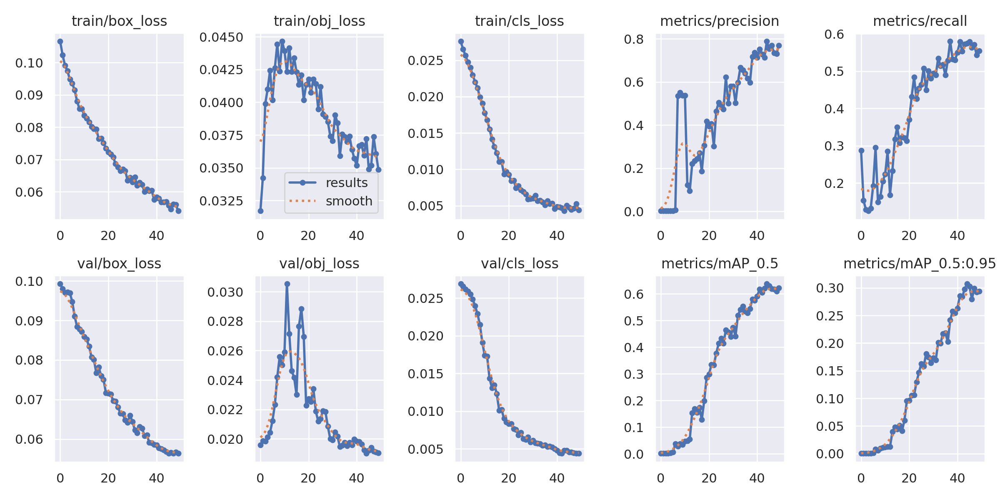

▶️ Confusion matrix (if available):


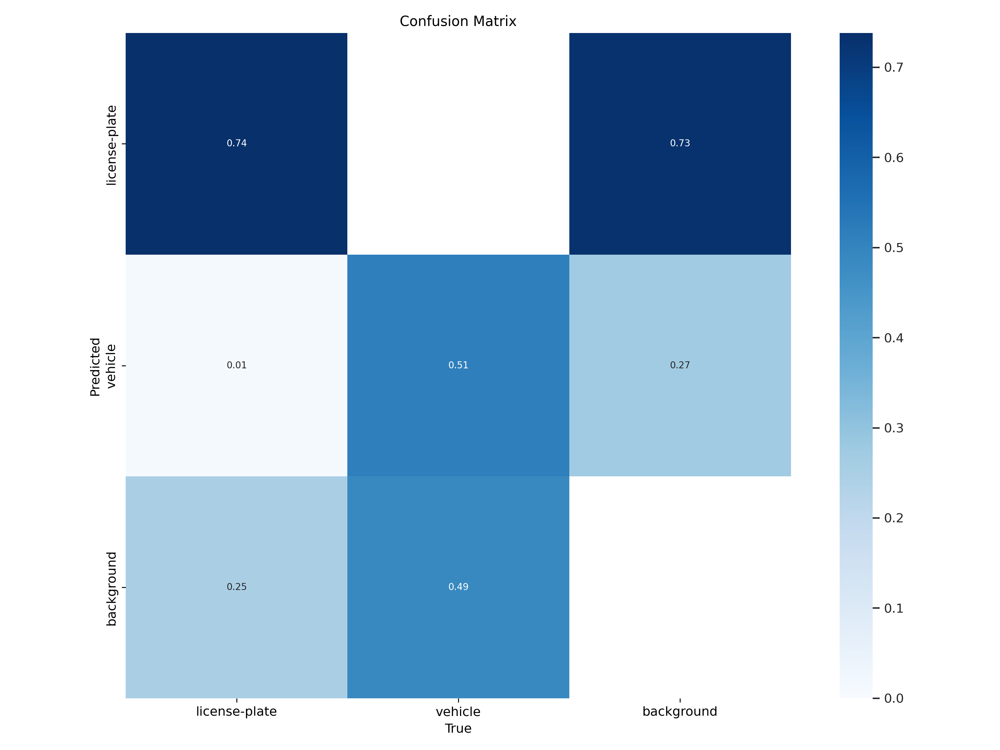

In [50]:
from IPython.display import Image, display

run_dir = "/kaggle/working/results/finetune_customyaml"

print("▶️ Training curves:")
display(Image(f"{run_dir}/results.png", width=900))

print("▶️ Confusion matrix (if available):")
display(Image(f"{run_dir}/confusion_matrix.png", width=600))


In [52]:
%%bash
echo "Contents of your run directory:"
ls -1 /kaggle/working/results/finetune_customyaml


Contents of your run directory:
confusion_matrix.png
events.out.tfevents.1746729735.2bb52e2ebc3f.385.0
F1_curve.png
hyp.yaml
labels_correlogram.jpg
labels.jpg
opt.yaml
P_curve.png
PR_curve.png
R_curve.png
results.csv
results.png
train_batch0.jpg
train_batch1.jpg
train_batch2.jpg
val_batch0_labels.jpg
val_batch0_pred.jpg
val_batch1_labels.jpg
val_batch1_pred.jpg
val_batch2_labels.jpg
val_batch2_pred.jpg
weights


GROUND TRUTH (VAL BATCH 0):


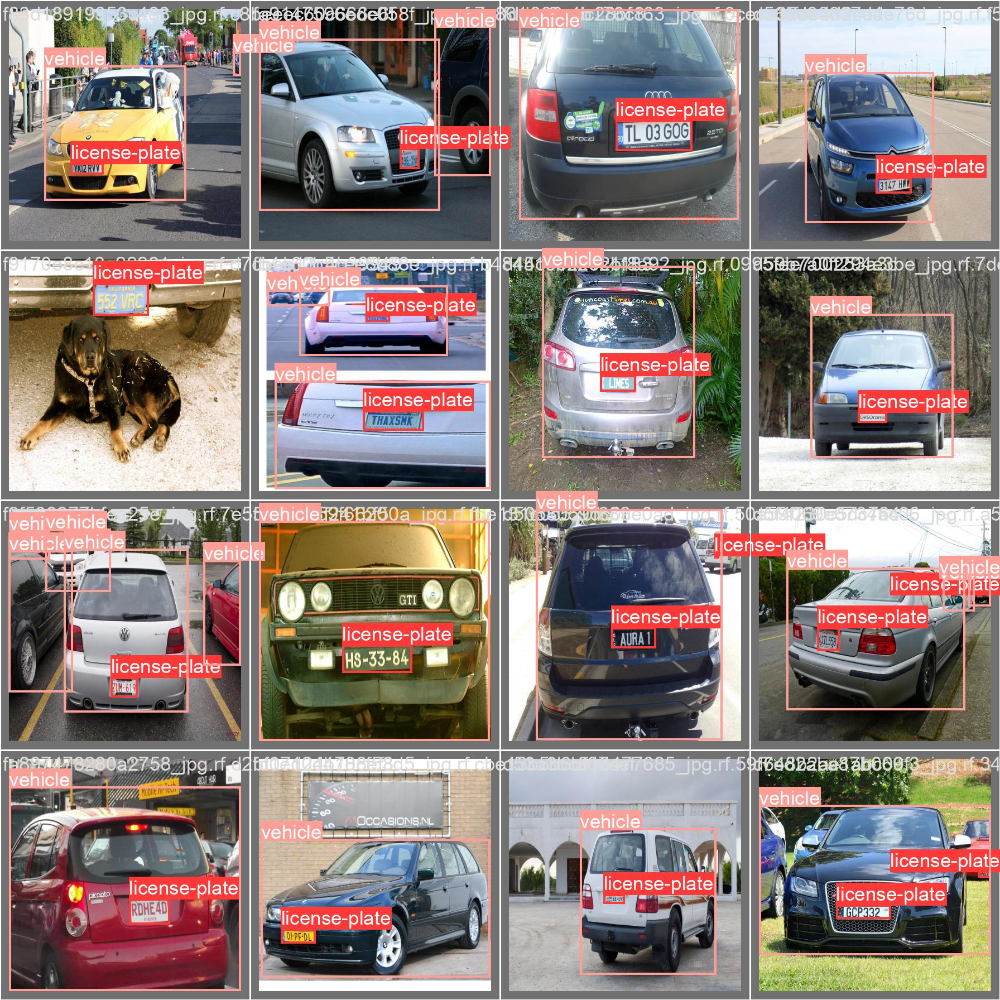

PREDICTIONS (VAL BATCH 0):


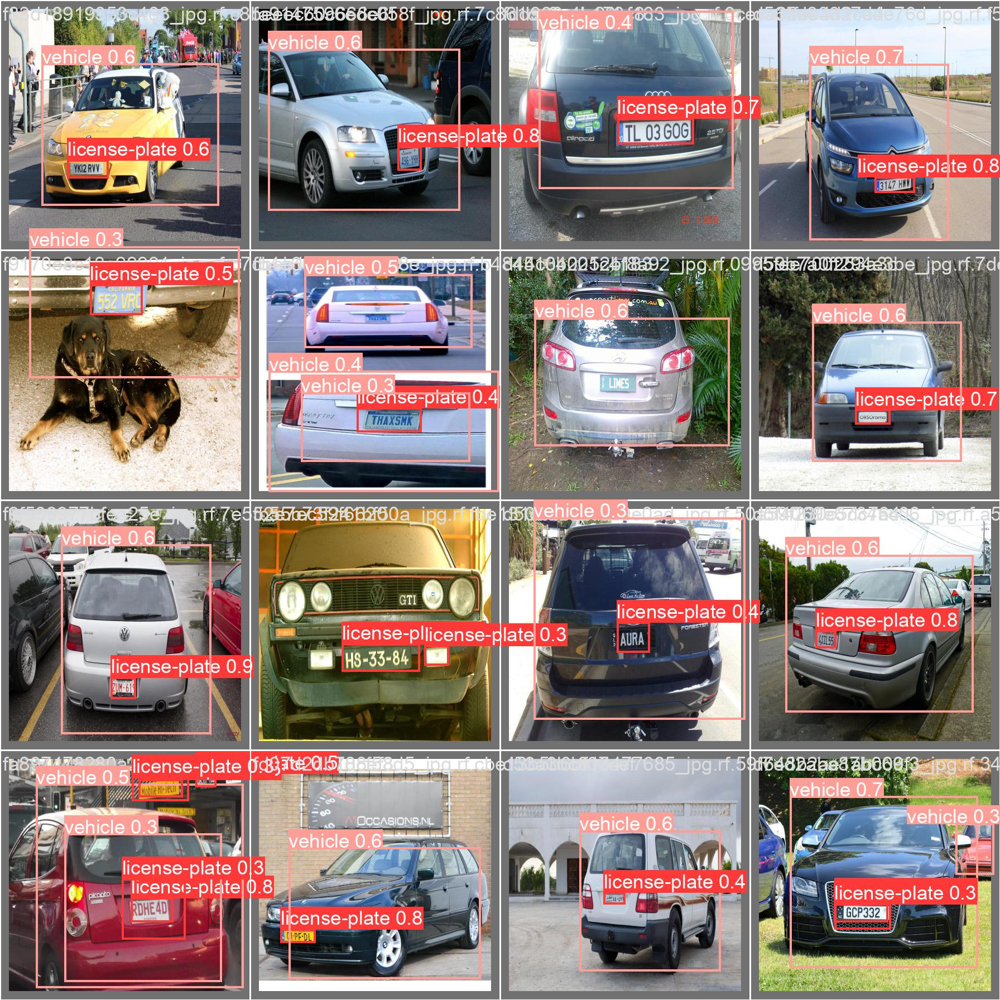

AUGMENTED TRAINING DATA (TRAIN BATCH 0):


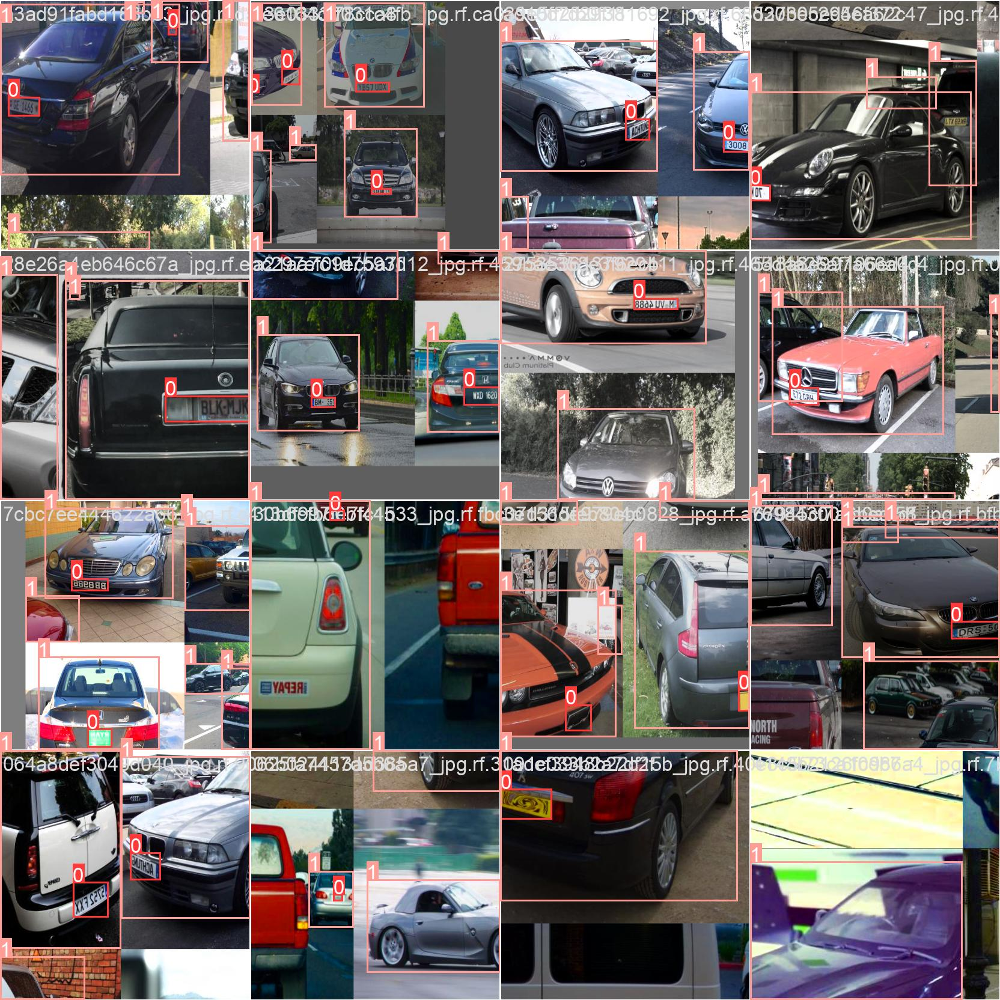

In [53]:
from IPython.display import Image, display

run_dir = "/kaggle/working/results/finetune_customyaml"

# 1️⃣ Ground-truth on validation batch 0
print("GROUND TRUTH (VAL BATCH 0):")
display(Image(f"{run_dir}/val_batch0_labels.jpg", width=900))

# 2️⃣ Model predictions on validation batch 0
print("PREDICTIONS (VAL BATCH 0):")
display(Image(f"{run_dir}/val_batch0_pred.jpg", width=900))

# 3️⃣ Augmented training batch 0 (mosaic, etc.)
print("AUGMENTED TRAINING DATA (TRAIN BATCH 0):")
display(Image(f"{run_dir}/train_batch0.jpg", width=900))


In [54]:
%%bash
# 1) cd into your YOLOv5 code folder
cd /kaggle/working/yolov5

# 2) Use 'best.pt' from your fine‐tune run for inference
WEIGHTS="/kaggle/working/results/finetune_customyaml/weights/best.pt"
SOURCE="../test/images"   # adjust if your test images live elsewhere

python detect.py \
  --weights "${WEIGHTS}" \
  --img 416 \
  --conf 0.25 \
  --source "${SOURCE}" \
  --project ../results \
  --name infer_finetuned \
  --save-txt \
  --save-conf


detect: weights=['/kaggle/working/results/finetune_customyaml/weights/best.pt'], source=../test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_format=0, save_csv=False, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=../results, name=infer_finetuned, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-416-gfe1d4d99 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)

Fusing layers... 
custom_YOLOv5m summary: 182 layers, 7249215 parameters, 0 gradients
image 1/35 /kaggle/working/test/images/b15d6c0bdf90226d_jpg.rf.775557ba6aaf7d76a8d4bb04f66d8fc5.jpg: 416x416 1 license-plate, 1 vehicle, 6.3ms
image 2/35 /kaggle/working/test/images/b193070a9c45b5ab_jpg.rf.57e5987eb896a7bf9fc7a1a96a660c7e.jpg: 416x416 2 license-plates, 1 v

Displaying 35 images from /kaggle/working/results/infer_finetuned:



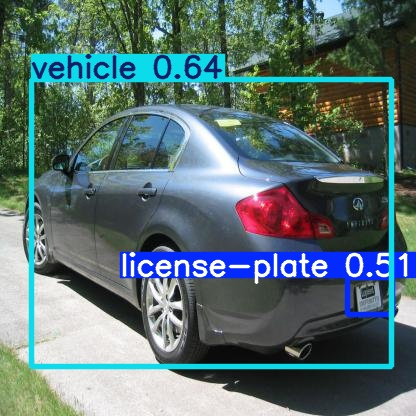

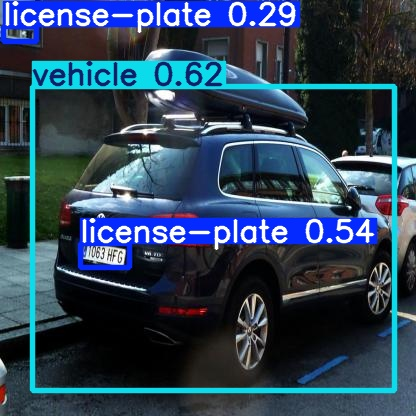

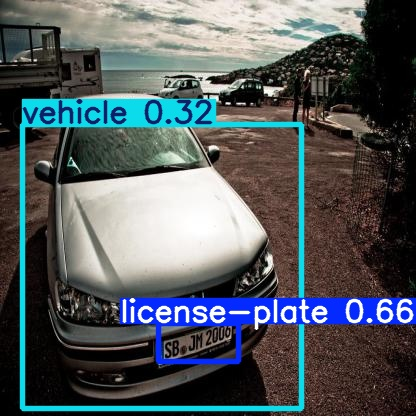

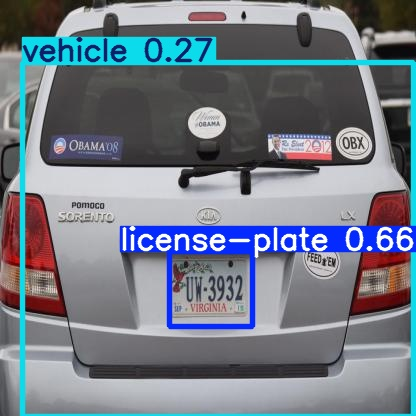

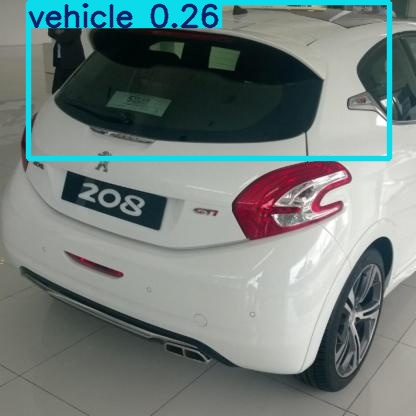

...

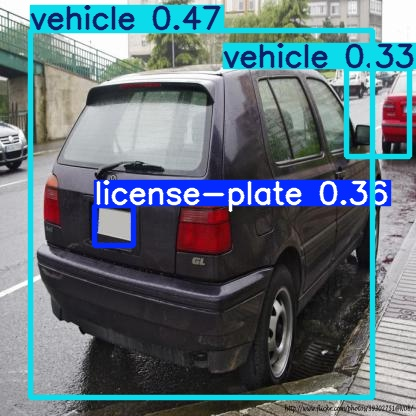

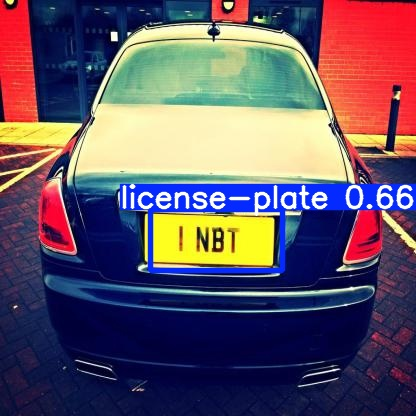

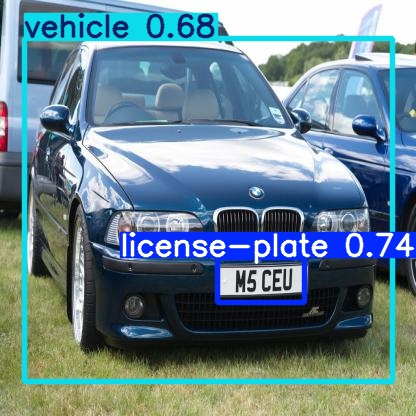

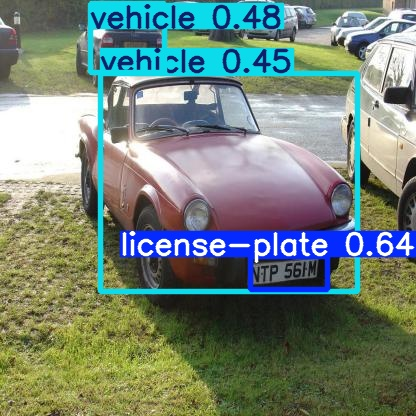

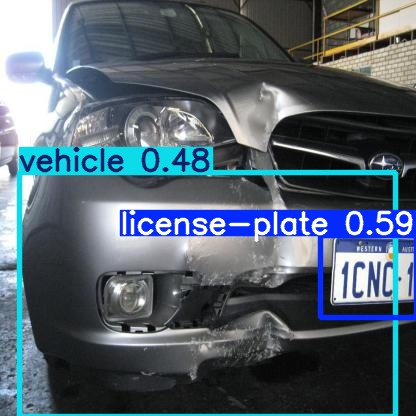

In [55]:
import glob
from IPython.display import Image, display

out_dir = "/kaggle/working/results/infer_finetuned"
pattern = f"{out_dir}/*.jpg"

print(f"Displaying {len(glob.glob(pattern))} images from {out_dir}:\n")
for img_path in sorted(glob.glob(pattern)):
    display(Image(filename=img_path, width=600))
    print()  # blank line between images


Exactly. For each detected object YOLOv5 outputs:

Class label (e.g. vehicle, license-plate)

Confidence score (the probability the box contains that class, e.g. 0.55, 0.79)

Bounding-box coordinates (the pixel rectangle [x1, y1, x2, y2] around the object)

So in our example image you see:

A vehicle detection with confidence 0.55 around the whole car

A license-plate detection with confidence 0.79 around the plate itself



In [56]:
### Inference on test data set

In [59]:
%%bash
set -e

# 1) Enter your YOLOv5 code directory
cd /kaggle/working/yolov5

# 2) Run inference on your test set
python detect.py \
  --weights weights/pretrained.pt \
  --img 416 \
  --conf 0.4 \
  --source ../test/images \
  --project ../results \
  --name inference_run \
  --exist-ok \
  --save-txt \
  --save-conf


detect: weights=['weights/pretrained.pt'], source=../test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_format=0, save_csv=False, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=../results, name=inference_run, exist_ok=True, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-416-gfe1d4d99 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)

Fusing layers... 
Model summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/35 /kaggle/working/test/images/b15d6c0bdf90226d_jpg.rf.775557ba6aaf7d76a8d4bb04f66d8fc5.jpg: 416x416 (no detections), 5.0ms
image 2/35 /kaggle/working/test/images/b193070a9c45b5ab_jpg.rf.57e5987eb896a7bf9fc7a1a96a660c7e.jpg: 416x416 1 license_plate, 5.0ms
image 3/35 /kaggle/working/test/images/b1a50a38

Found 35 output images in /kaggle/working/results/inference_run



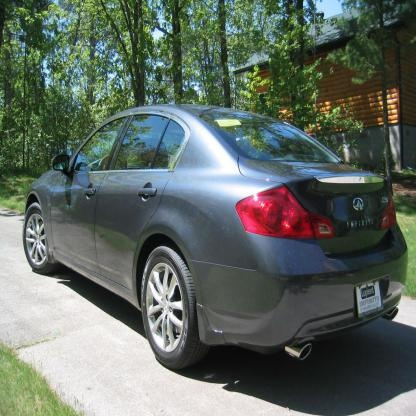

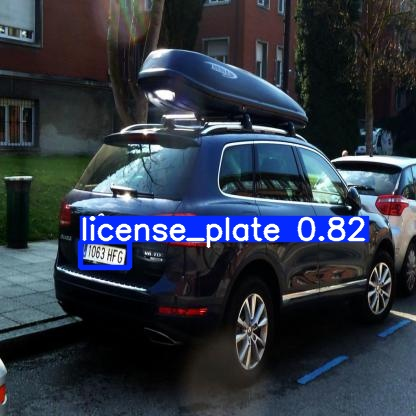

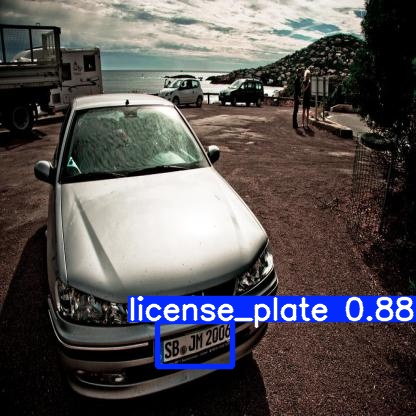

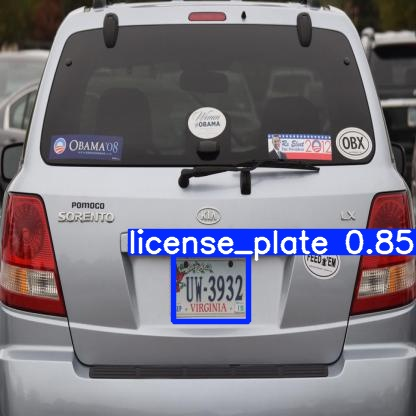

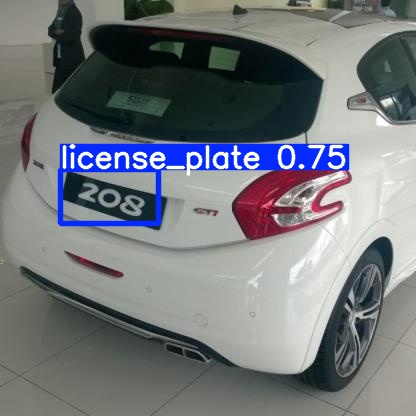

...

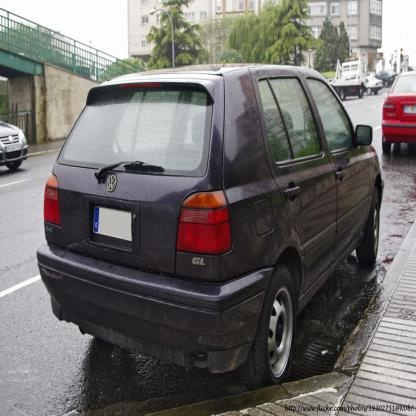

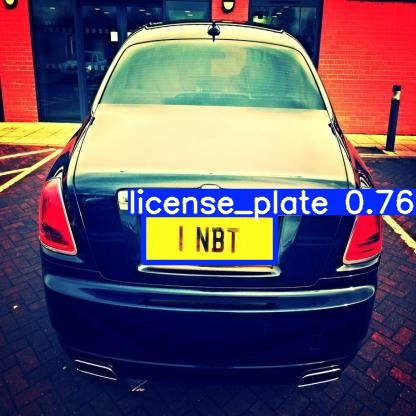

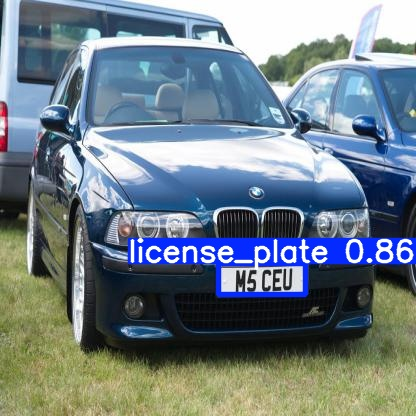

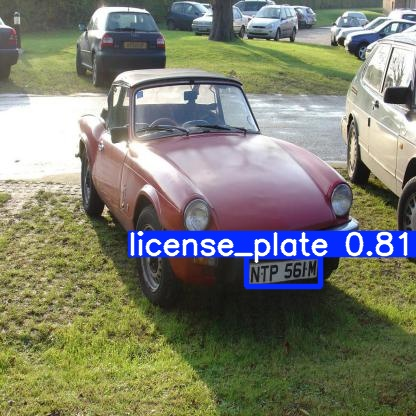

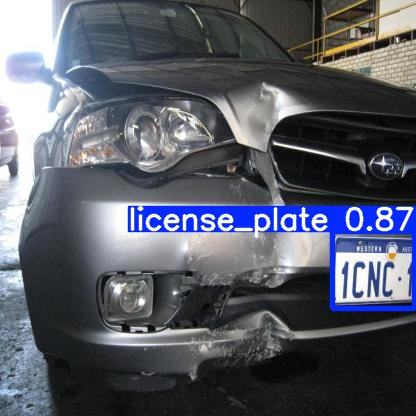

In [60]:
import glob
from IPython.display import Image, display

out_dir = "/kaggle/working/results/inference_run"
pattern = f"{out_dir}/*.jpg"

files = sorted(glob.glob(pattern))
print(f"Found {len(files)} output images in {out_dir}\n")
for img_path in files:
    display(Image(filename=img_path, width=700))
    print()


In [62]:
%%bash
set -e

# 1) Move into the YOLOv5 folder
cd /kaggle/working/yolov5

# 2) Run detection, saving boxes (.txt) and crops
python detect.py \
  --weights weights/pretrained.pt \
  --img 416 \
  --conf 0.4 \
  --source ../test/images \
  --project ../results \
  --name bbox_and_crop \
  --exist-ok \
  --save-txt \
  --save-conf \
  --save-crop


detect: weights=['weights/pretrained.pt'], source=../test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_format=0, save_csv=False, save_conf=True, save_crop=True, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=../results, name=bbox_and_crop, exist_ok=True, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-416-gfe1d4d99 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)

Fusing layers... 
Model summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/35 /kaggle/working/test/images/b15d6c0bdf90226d_jpg.rf.775557ba6aaf7d76a8d4bb04f66d8fc5.jpg: 416x416 (no detections), 5.0ms
image 2/35 /kaggle/working/test/images/b193070a9c45b5ab_jpg.rf.57e5987eb896a7bf9fc7a1a96a660c7e.jpg: 416x416 1 license_plate, 5.2ms
image 3/35 /kaggle/working/test/images/b1a50a382

Found 35 annotated images:



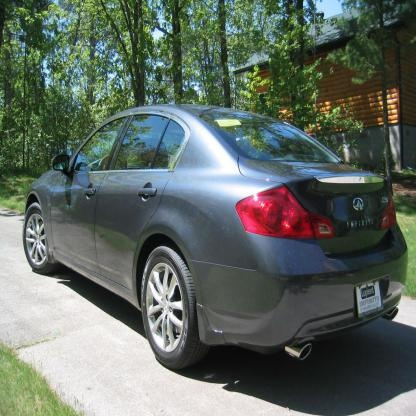

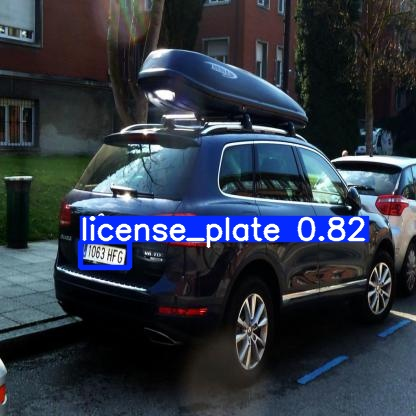

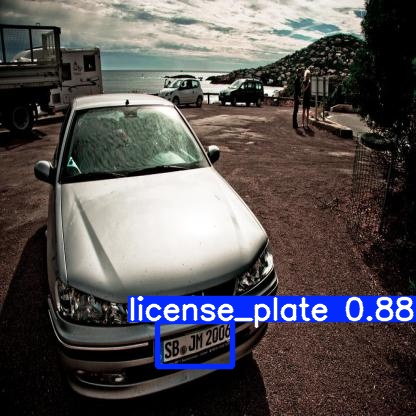

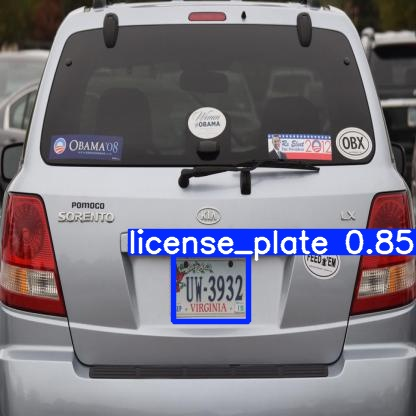

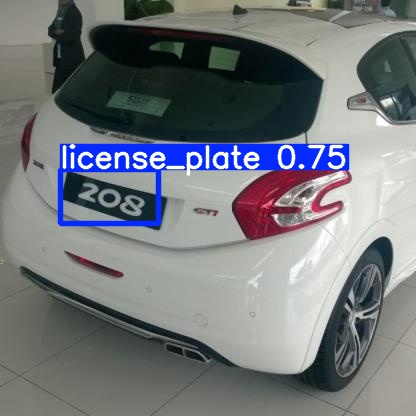

...

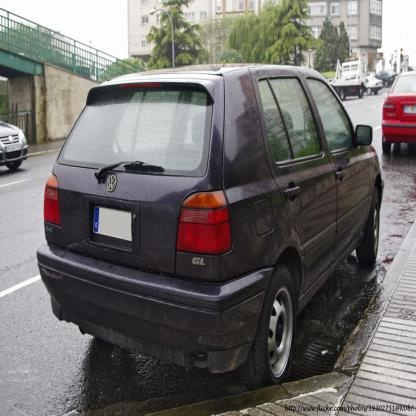

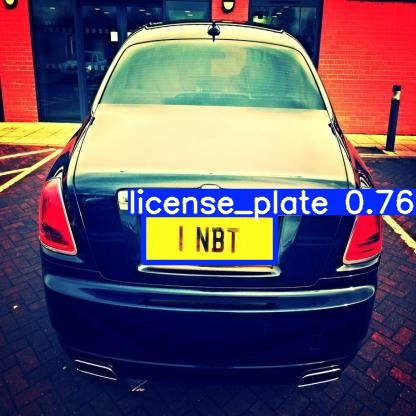

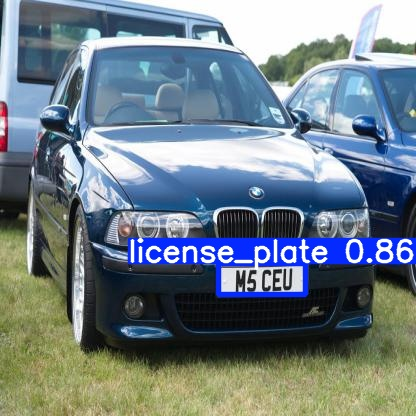

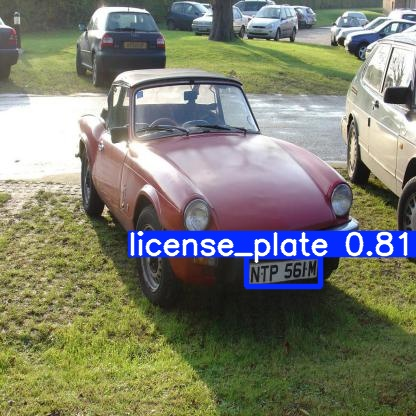

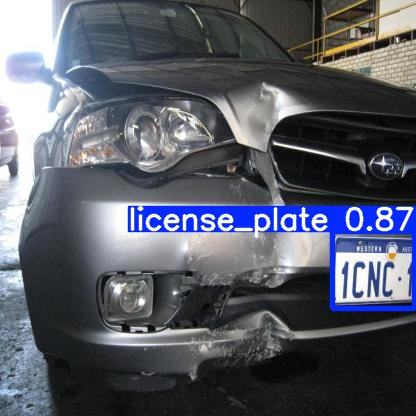



And 0 license-plate crops:


In [63]:
import glob
from IPython.display import Image, display

out_dir = "/kaggle/working/results/bbox_and_crop"

print(f"Found {len(glob.glob(out_dir+'/*.jpg'))} annotated images:\n")
for img_path in sorted(glob.glob(out_dir+"/*.jpg")):
    display(Image(filename=img_path, width=700))
    print()

print(f"\nAnd {len(glob.glob(out_dir+'/crops/license-plate/*.jpg'))} license-plate crops:")
for c in sorted(glob.glob(out_dir+"/crops/license-plate/*.jpg"))[:5]:  # show first 5
    display(Image(filename=c, width=200))
    print()


In [64]:
import glob
from IPython.display import Image, display

# Path to the folder where YOLOv5 saved your cropped plates
crop_dir = "/kaggle/working/results/bbox_and_crop/crops/license-plate"

# List all the cropped plate images
plate_paths = sorted(glob.glob(f"{crop_dir}/*.jpg"))

print(f"Found {len(plate_paths)} cropped license plates:\n")

# Display each one inline
for img_path in plate_paths:
    display(Image(filename=img_path, width=250))
    print()  # blank line between images


Found 0 cropped license plates:



In [65]:
%%bash
echo "Crop subfolders:"
ls -1 /kaggle/working/results/bbox_and_crop/crops


Crop subfolders:
license_plate


Found 29 cropped license plates in 'license_plate':



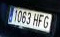

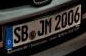

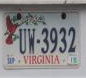

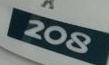

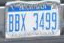

...

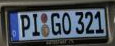

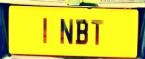

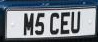

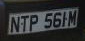

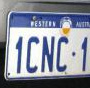

In [66]:
import glob
from IPython.display import Image, display

# Adjust this if your subfolder is named differently
crop_subfolder = "license_plate"  # or "license-plate" based on the listing

crop_dir = f"/kaggle/working/results/bbox_and_crop/crops/{crop_subfolder}"
plate_paths = sorted(glob.glob(f"{crop_dir}/*.jpg"))

print(f"Found {len(plate_paths)} cropped license plates in '{crop_subfolder}':\n")

for img_path in plate_paths:
    display(Image(filename=img_path, width=250))
    print()


In [67]:
%%bash
cd /kaggle/working/results/bbox_and_crop
zip -r /kaggle/working/license_plate_crops.zip crops/license_plate


  adding: crops/license_plate/ (stored 0%)
  adding: crops/license_plate/c91ee912164d8ecb_jpg.rf.5a70d8b40bde25a3a4cb09337bf0c6f9.jpg (deflated 3%)
  adding: crops/license_plate/be9fd0014b5a4f2a_jpg.rf.20dc7369d0a83ad74a123727228dce11.jpg (deflated 3%)
  adding: crops/license_plate/c7df5232291486a3_jpg.rf.d18b52a383576cfe6c4ec343fca07a80.jpg (deflated 4%)
  adding: crops/license_plate/b7cdb5c0c99002b7_jpg.rf.2c46810fbf4036039cb03a135e20e9c3.jpg (deflated 5%)
  adding: crops/license_plate/b25d7d2cb7abf86b_jpg.rf.36edce738b0e69965e001035d6f85ab3.jpg (deflated 4%)
  adding: crops/license_plate/be654a7eabe0e891_jpg.rf.5e43d4106641423a278d096d24822902.jpg (deflated 5%)
  adding: crops/license_plate/b32671b7cc279583_jpg.rf.f898026e2169a3b6adc4d21aee6d06c5.jpg (deflated 4%)
  adding: crops/license_plate/b6e55f97085c3732_jpg.rf.09a6d8dc1a08e66131bdb8b57377b05b.jpg (deflated 7%)
  adding: crops/license_plate/b91c3aaba25bf914_jpg.rf.1f03184f0c412a59b83c4099861cedcf.jpg (deflated 6%)
  adding: cr